## Exercise 2: Population structure analysis using STRs


#### Read and transpose the dataset

In [1]:
import pandas as pd
df = pd.read_csv("kg_matrix_chr1.csv", index_col=0)

# transpose so samples become rows
X = df.T

#### Read the information on the samples

In [2]:
meta = pd.read_csv("sample_type.csv")

#### Merge the genotype and metadata

In [35]:
merged = X.merge(meta, left_index=True, right_on="sample")
merged.head()

,0,1,2,3,4,5,6,7,8,9,...,30632,30633,30634,sample,Population,Superpopulation,coding_one_allele_non_ref,coding_two_alleles_non_ref,wg_one_allele_non_ref,wg_two_alleles_non_ref
2162,23.0,24.5,19.0,20.5,13.0,21.5,18.0,9.0,10.0,6.0,...,13.5,13.5,20.5,NA19024,LWK,AFR,163.0,150.0,208638.0,194449.0
2005,23.0,25.0,19.0,23.0,13.0,21.0,17.0,10.0,7.0,6.5,...,13.0,13.5,21.0,HG03117,ESN,AFR,174.0,147.0,206265.0,196039.0
134,23.5,25.0,18.0,23.0,13.0,22.0,18.0,9.0,8.5,6.0,...,13.5,13.5,20.5,NA19120,YRI,AFR,177.0,151.0,205300.0,195504.0
2707,23.0,26.0,19.0,22.0,10.5,25.5,17.0,8.0,NaN,2.0,...,15.0,14.5,21.0,HG03492,PJL,SAS,159.0,115.0,177020.0,177434.0
135,24.0,24.5,19.0,23.0,10.5,21.0,17.0,9.5,8.5,6.0,...,13.0,13.5,21.0,NA19238,YRI,AFR,171.0,138.0,204446.0,196568.0


#### Split the features and labels

In [4]:
X_data = merged.drop(columns=["sample", "Superpopulation","Population"])
y = merged["Superpopulation"]
X_data.head()

,0,1,2,3,4,5,6,7,8,9,...,30629,30630,30631,30632,30633,30634,coding_one_allele_non_ref,coding_two_alleles_non_ref,wg_one_allele_non_ref,wg_two_alleles_non_ref
2162,23.0,24.5,19.0,20.5,13.0,21.5,18.0,9.0,10.0,6.0,...,13.0,24.0,11.5,13.5,13.5,20.5,163.0,150.0,208638.0,194449.0
2005,23.0,25.0,19.0,23.0,13.0,21.0,17.0,10.0,7.0,6.5,...,13.0,24.0,15.0,13.0,13.5,21.0,174.0,147.0,206265.0,196039.0
134,23.5,25.0,18.0,23.0,13.0,22.0,18.0,9.0,8.5,6.0,...,13.0,24.0,17.0,13.5,13.5,20.5,177.0,151.0,205300.0,195504.0
2707,23.0,26.0,19.0,22.0,10.5,25.5,17.0,8.0,NaN,2.0,...,13.0,25.0,12.5,15.0,14.5,21.0,159.0,115.0,177020.0,177434.0
135,24.0,24.5,19.0,23.0,10.5,21.0,17.0,9.5,8.5,6.0,...,12.0,24.0,12.5,13.0,13.5,21.0,171.0,138.0,204446.0,196568.0


#### Impute NAs, standardise the data and run PCA

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X_data.columns = X_data.columns.astype(str)

# 1. fast imputation
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X_data)

# 2. scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# 3. PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

#### Plot PCA colored by population

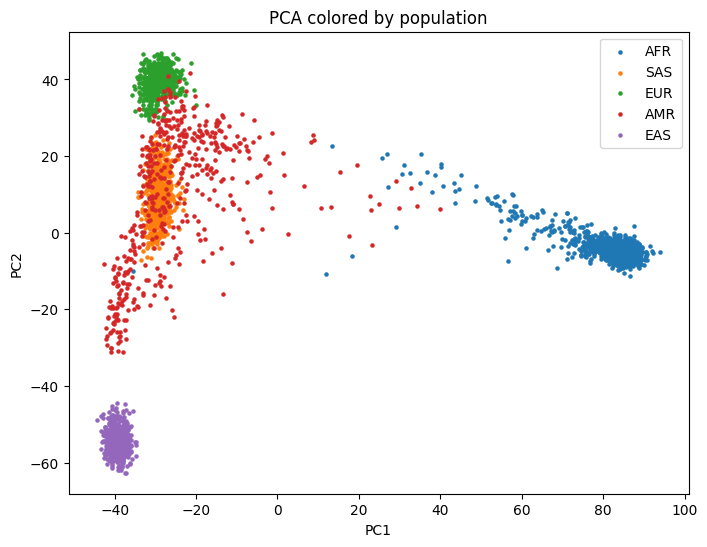

In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))

for pop in y.unique():
    idx = y == pop
    plt.scatter(X_pca[idx,0], X_pca[idx,1], label=pop,s=5)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.title("PCA colored by population")
plt.show()

### Clustering Analysis
#### K-means clustering

In [7]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=len(y.unique()), random_state=42)
clusters = kmeans.fit_predict(X_pca)

#### Evaluate clustering

In [8]:
from sklearn.metrics import silhouette_score

sil_score = silhouette_score(X_pca, clusters)
print("Silhouette score:", sil_score)

Silhouette score: 0.720619546691621


#### Compare clusters to real populations

In [9]:
import pandas as pd

comparison = pd.crosstab(y, clusters)
print(comparison)

col_0              0    1    2    3   4
Superpopulation                        
AFR              826    1    0    0  66
AMR                0  299   32  145  14
EAS                0    0  585    0   0
EUR                0    0    0  633   0
SAS                0  592    0    9   0


#### Plot PCA with generated clusters

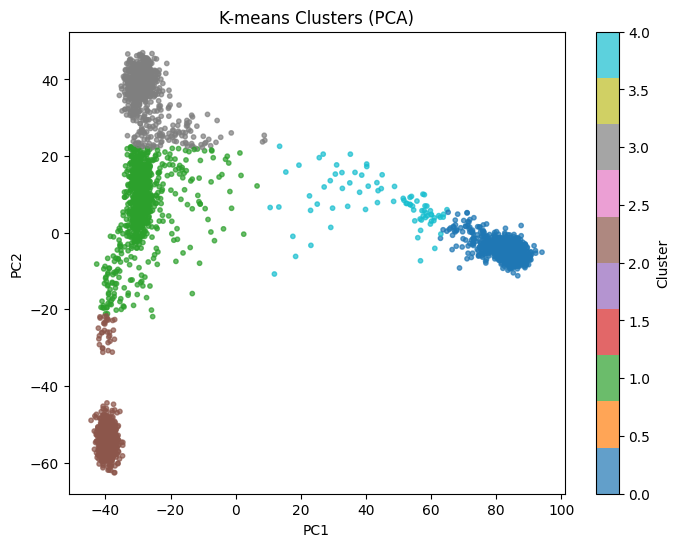

In [39]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    X_pca[:,0],
    X_pca[:,1],
    c=clusters,
    cmap="tab10",
    s=10,
    alpha=0.7
)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("K-means Clusters (PCA)")

plt.colorbar(scatter, label="Cluster")
plt.show()

#### Visualise cluster composition within each superpopulation

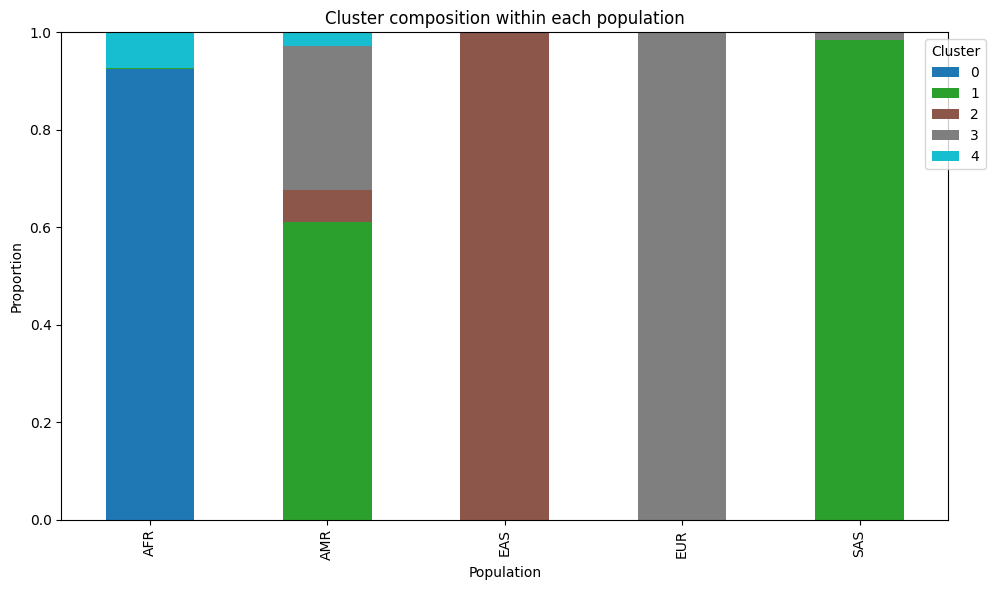

In [ ]:
import matplotlib.pyplot as plt

ct_norm = comparison.div(comparison.sum(axis=1), axis=0)

ct_norm.plot(
    kind="bar",
    stacked=True,
    figsize=(10,6),
    colormap="tab10"
)

plt.ylabel("Proportion")
plt.xlabel("Population")
plt.title("Cluster composition within each population")

plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1))
plt.tight_layout()

plt.show()

### Supervised classification
#### Split into training and test

In [10]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_pca, y, test_size=0.2, random_state=42, stratify=y
)

##### Apply Random Forest Classifier

In [11]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=300, random_state=42)
clf.fit(X_train, y_train)

,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",300
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.Note: This parameter is tree-specific.",'gini'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=""sqrt""The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to `""sqrt""`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",'sqrt'
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the current node, ``N_t_L`` is the number of samples in theleft child, and ``N_t_R`` is the number of samples in the right child.``N``, ``N_t``, ``N_t_R`` and ``N_t_L`` all refer to the weighted sum,if ``sample_weight`` is passed... versionadded:: 0.19",0.0
,"bootstrap bootstrap: bool, default=TrueWhether bootstrap samples are used when building trees. If False, thewhole dataset is used to build each tree.",True
,"oob_score oob_score: bool or callable, default=FalseWhether to use out-of-bag samples to estimate the generalization score.By default, :func:`~sklearn.metrics.accuracy_score` is used.Provide a callable with signature `metric

#### Evaluation

In [12]:
from sklearn.metrics import accuracy_score, classification_report

y_pred = clf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.9297971918876755
              precision    recall  f1-score   support

         AFR       0.98      0.99      0.99       179
         AMR       0.80      0.72      0.76        98
         EAS       1.00      1.00      1.00       117
         EUR       0.99      0.98      0.98       127
         SAS       0.82      0.88      0.85       120

    accuracy                           0.93       641
   macro avg       0.92      0.92      0.92       641
weighted avg       0.93      0.93      0.93       641



##### Confusion matrix

In [13]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
print(cm)

[[178   1   0   0   0]
 [  3  71   0   1  23]
 [  0   0 117   0   0]
 [  0   3   0 124   0]
 [  0  14   0   0 106]]


#### Visualise model performance with confusion matrix

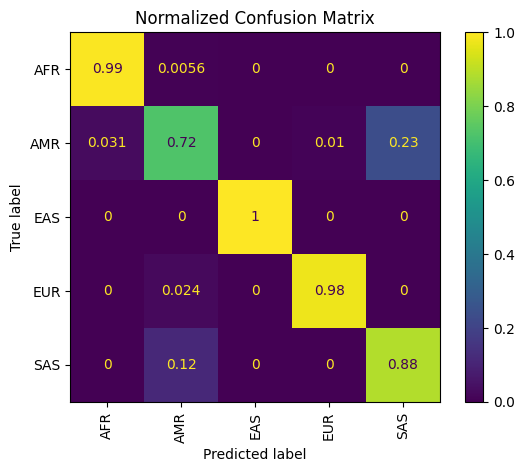

In [29]:
cm_norm = confusion_matrix(y_test, y_pred, normalize="true")

disp = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=clf.classes_)
disp.plot(xticks_rotation=90)

plt.title("Normalized Confusion Matrix")
plt.show()

### Interpretation: comparison between STR and SNV results
The STR-based K-clustering separated samples by superpopulation more clearly than the SNV analysis. This is what we expect based on the nature of STR variation: STRs mutate more frequently and therefore exhibit higher variability. This means that since humans have diverged across continents, their STR profile changed more than the SNV structure.  

Like in the SNV analysis, Africa and East Asia were composed of almost only a single cluster. In the SNV analysis with K = 5, Europe was also almost only one cluster, like in the STR analysis. STRs provided noticeably better resolution for South Asia, while both STR and SNV approaches showed limitations in resolving populations from the Americas.  

Although the PCA plots appear similar overall, STR data display a much wider range of values due to their greater variance. Despite this, the relative spread and distances between superpopulations are comparable between the SNV and STR analyses.   

The high accuracy of the STR analysis also explains the high accuracy of the classification model (overall accuracy of 0.93).